In [47]:
%matplotlib inline

import matplotlib.pyplot as plt

from PIL import Image
import numpy as np

from tqdm import trange
import random

import scipy.io
import tqdm

import torch
import torch.nn as nn
import torchvision.models as models

# Image Display

In [48]:
def show_top_images ( dataset_path, indices , id_test , ids , labels ) :
    
    label = (ids[id_test] - 1) // 80

    name = dataset_path + '/jpg/' + str(label) + '/image_' + str(ids[id_test]).zfill(4) + '.jpg'
    image = Image.open( name )
    
    top = 0
    show_image_label(top, image, labels[id_test], ids[id_test] )
    
    accuracy = 0
    
    for i in indices[0] :
        label_i = labels[i]
        name = dataset_path + '/jpg/' + str(label_i) + '/image_' + str(ids[i]).zfill(4) + '.jpg'

        image = Image.open( name )

        show_image_label(top, image, label_i, ids[i] )   
        top = top + 1
        
    
def show_image_label ( top, image, label , image_id ) :
    
    plt.figure(figsize = (5,5))
    plt.imshow(image, aspect='auto')
    plt.axis('off')
    plt.title(f'{top} - Image id {image_id} with label {label}.')
    plt.show()

# Generate descriptors

In [49]:
def create_deep_descriptors (image, model, my_transform, my_device='cpu') :

    model_input = my_transform(image) 
    model_input = model_input.unsqueeze_(0)
    
    model = model.to(my_device)
    model_input = model_input.to(my_device)

    model.eval()
    with torch.no_grad():
        desc_deep = model(model_input).squeeze(0)
    
    return desc_deep.to('cpu')

# Data

In [50]:
def represent_dataset( dataset_path, model, my_transform, my_device ) :

    mat = scipy.io.loadmat( dataset_path+'/datasplits.mat' )

    ids = mat['tst1'][0] #  'tst1' or 'trn1' or 'val1' 
    
    space = []
    labels = []
    
    for id in tqdm.tqdm(ids, desc='Processing test set') :

        label = (id - 1) // 80
        name = dataset_path + '/jpg/' + str(label) + '/image_' + str(id).zfill(4) + '.jpg'

        image = Image.open( name )
        
        if image is None:
            print(f'Reading image Error. Path: {name}')
            return None

        desc_deep = create_deep_descriptors(image, model, my_transform, my_device)

        space.append(desc_deep)
        labels.append(label)
        
    print( ' -> [I] Space Describing Info:\n', 
        '\nNumber of images: ', len(space), 
        '\nNumber of labels: ', len(labels),
        '\nDimension: ', len(space[0])
        )

    return space , labels 

In [51]:
from sklearn.neighbors import NearestNeighbors

def run_test ( space , labels , dataset_path, model, my_transform, my_device, top=10 ) :
    knn = NearestNeighbors(n_neighbors=top+1).fit(space)
    
    mat = scipy.io.loadmat( dataset_path+'/datasplits.mat' )

    ids = mat['tst1'][0] #  'tst1' or 'trn1' or 'val1'
    
    accuracy_t = 0
    
    for id_test in tqdm.tqdm(ids, desc='running the test phase') :
        
        label = (id_test - 1) // 80
        name = dataset_path + '/jpg/' + str(label) + '/image_' + str(id_test).zfill(4) + '.jpg'

        image = Image.open( name )
        
        desc_deep = create_deep_descriptors(image, model, my_transform, my_device)

        indices = knn.kneighbors(desc_deep.reshape(1, -1))[1]

        labels_top = [ labels[i] for i in indices[0] ]

        accuracy = sum( np.equal(labels_top, label) )
        accuracy =( (accuracy-1)/(top) ) * 100
        accuracy_t = accuracy_t + accuracy
        
    print(f'Average accuracy in the test set: {accuracy_t/len(ids):5.2f}%')
    

# Experimental evaluation

In [52]:
def retrieve_single_image ( space , labels , dataset_path, model, my_transform, my_device, top=10 ) :
    knn = NearestNeighbors(n_neighbors=top+1).fit(space)
    
    mat = scipy.io.loadmat( dataset_path+'/datasplits.mat' )

    ids = mat['tst1'][0] #  'trn1' or 'val1'
    
    id_test = random.randrange( len(ids) )
        
    label = (ids[id_test] - 1) // 80
    name = dataset_path + '/jpg/' + str(label) + '/image_' + str(ids[id_test]).zfill(4) + '.jpg'
    
    image = Image.open( name )
    
    if image is None:
        print(f'Reading image Error. Path: {name}')
        return None

    desc_deep = create_deep_descriptors(image, model, my_transform, my_device)
    
    distances, indices = knn.kneighbors(desc_deep.reshape(1, -1))
    
    show_top_images(dataset_path, indices, id_test, ids, labels)
    
    labels_top = [ int(labels[i]) for i in indices[0] ]
    
    accuracy = sum( np.equal( label , labels_top ) )
    accuracy =( (accuracy-1)/(top) ) * 100 
    
    print(f'Accuracy for image id {ids[id_test]}: {accuracy:5.2f}%')
    
    print(name)    
    print(f'Image: {ids[id_test]} with label {labels[id_test]}')    
    print(f'Closest image: {ids[indices[0][0]]} with distance {distances[0][0]} and label {labels[indices[0][0]]}')
    print('Distances: ',distances)
    print('Indices: ',indices[0])
    print('Labels: ',labels_top)

# Create the Descriptor model and load weights 


Aqui vocês devem:
1. Criar o modelo descritor que é uma arquitetura CNN sem a última camada da FC de classificação. Atribua a variável `model_descriptor`.
2. Criar o objeto que indica quais são as transformações necessárias para o modelo. Atribua a variável `my_transform`.
3. Definir se os modelos vão executar na CPU ou na GPU. Atribua a variável `my_device`.
4. Faça o teste com pelo menos 3 arquiteturas diferentes e reporte o resultado da função `run_test` em formato de tabela.

## Dataset

In [53]:
dataset_path = "../a3/flowers_classes-20250415T010641Z-001/flowers_classes"

## My device

In [54]:
my_device = 'cuda' if torch.cuda.is_available() else 'cpu'

## Architectures

### AlexNet

In [55]:
alexnet_imagenet_weights = models.AlexNet_Weights.IMAGENET1K_V1

alexnet_transform = alexnet_imagenet_weights.transforms()

alexnet = models.alexnet(weights=alexnet_imagenet_weights)

alexnet.classifier = alexnet.classifier[:-2]
alexnet.eval()

AlexNet(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(11, 11), stride=(4, 4), padding=(2, 2))
    (1): ReLU(inplace=True)
    (2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (3): Conv2d(64, 192, kernel_size=(5, 5), stride=(1, 1), padding=(2, 2))
    (4): ReLU(inplace=True)
    (5): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
    (6): Conv2d(192, 384, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (7): ReLU(inplace=True)
    (8): Conv2d(384, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (9): ReLU(inplace=True)
    (10): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=False)
  )
  (avgpool): AdaptiveAvgPool2d(output_size=(6, 6))
  (classifier): Sequential(
    (0): Dropout(p=0.5, inplace=False)
    (1): Linear(in_features=9216, out_features=4096, bias=True)
 

In [56]:
# Using model descriptor, represent all images in the testing split of the dataset. 
space, labels = represent_dataset ( dataset_path , alexnet, alexnet_transform, my_device )

Processing test set: 100%|██████████| 340/340 [00:20<00:00, 16.29it/s]


 -> [I] Space Describing Info:
 
Number of images:  340 
Number of labels:  340 
Dimension:  4096


In [57]:
# For each image of the testing split of the dataset, use the image as the query
# for the image retrieval problem, i.e., describe the image using the model descriptor, 
# and search for the k closest descriptors of the images in the testing split dataset. 
# After that, measure the accuracy of the image retrieval by counting how many of the k
# retrieved images has the same label of the query image, and divide it by k. 
# This result will be the accuracy of the image retrieval result for that specific image. 
# Repeat it for each image of the testing split of the dataset and compute the average of 
# all calculated accuracies.

run_test( space, labels, dataset_path, alexnet, alexnet_transform, my_device )

running the test phase: 100%|██████████| 340/340 [00:34<00:00,  9.75it/s]

Average accuracy in the test set: 54.50%


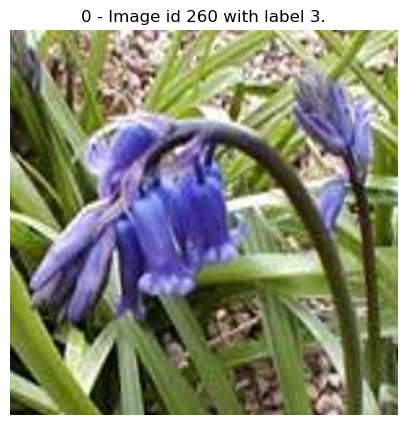

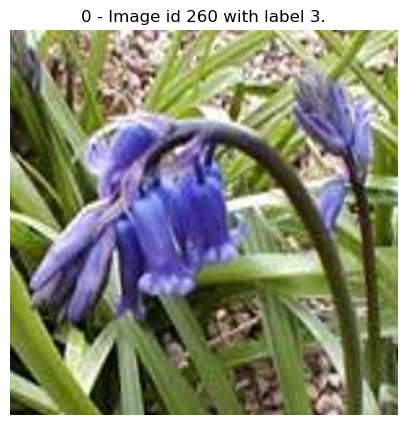

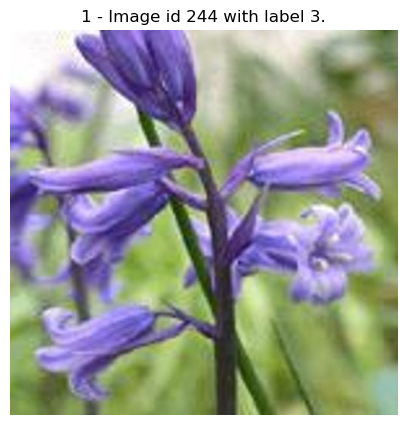

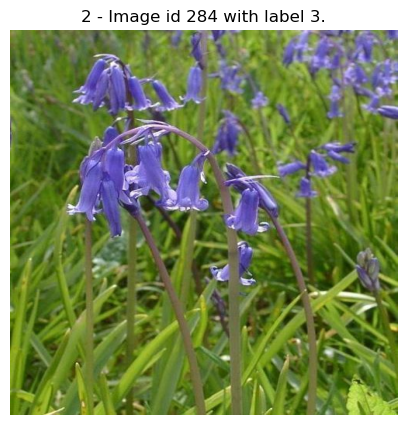

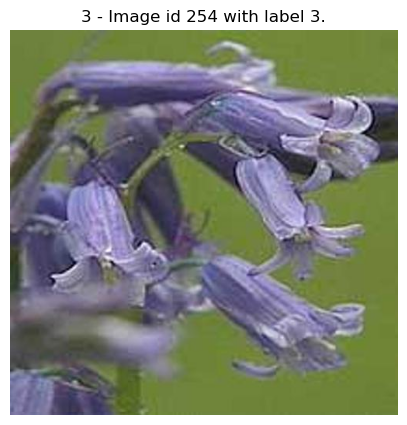

...

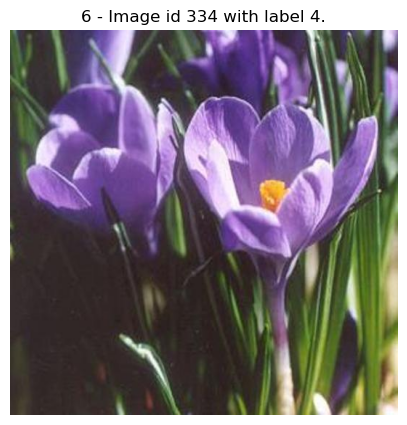

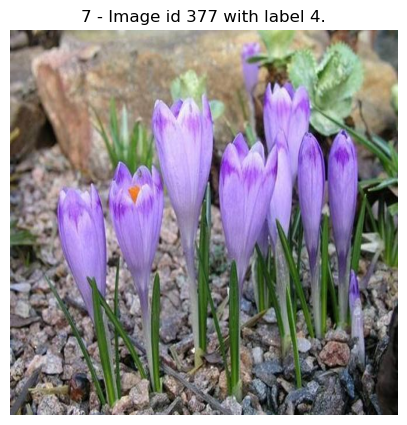

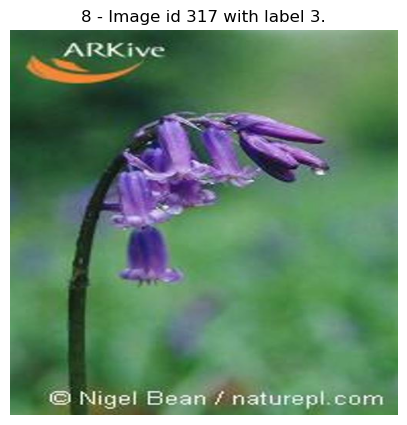

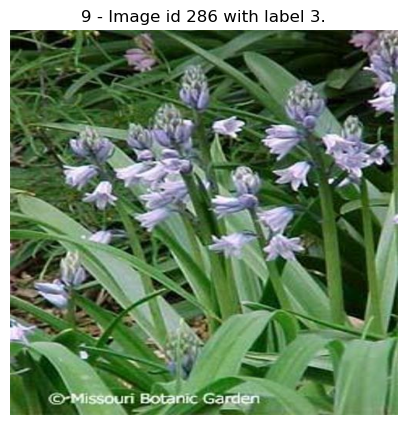

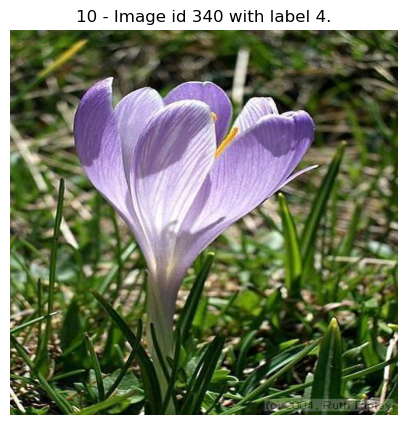

Accuracy for image id 260: 60.00%
../a3/flowers_classes-20250415T010641Z-001/flowers_classes/jpg/3/image_0260.jpg
Image: 260 with label 3
Closest image: 260 with distance 1.078959303413285e-05 and label 3
Distances:  [[1.07895930e-05 1.86794617e+02 2.17914642e+02 2.19035202e+02
  2.24201645e+02 2.31428299e+02 2.39520172e+02 2.41564484e+02
  2.46428024e+02 2.50965118e+02 2.51085800e+02]]
Indices:  [ 67  60  70  63  62 101  83  99  76  74  87]
Labels:  [3, 3, 3, 3, 3, 5, 4, 4, 3, 3, 4]


In [58]:
# For a random image of the testing split of the dataset, use the image as the query
# for the image retrieval problem, i.e., describe the image using the model descriptor, 
# and search for the k closest descriptors of the images in the testing split dataset. 
# After that, measure the accuracy of the image retrieval by counting how many of the k
# retrieved images has the same label of the query image, and divide it by k. 
# This result will be the accuracy of the image retrieval result for that specific image.
# Also display the query image, and all k images returned by the image retrieval problem.
# For each returned image, also display its class, and the Euclidean distance between its
# descriptor and the descriptor of the query image.
# Since the query image also is in the testing split of the dataset, it is expected that 
# the first returned image is the query image itself, and the distance between the 
# descriptors to be zero.

retrieve_single_image( space, labels, dataset_path, alexnet, alexnet_transform, my_device)

### VGG16

In [59]:
vgg16_imagenet_weights = models.VGG16_Weights.IMAGENET1K_V1

vgg16_transform = vgg16_imagenet_weights.transforms()

vgg16 = models.vgg16(weights=vgg16_imagenet_weights)

vgg16.classifier = vgg16.classifier[:-3]
vgg16.eval()

VGG(
  (features): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): ReLU(inplace=True)
    (2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (3): ReLU(inplace=True)
    (4): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (5): Conv2d(64, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 128, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (8): ReLU(inplace=True)
    (9): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
    (10): Conv2d(128, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (11): ReLU(inplace=True)
    (12): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (13): ReLU(inplace=True)
    (14): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (15): ReLU(inplace=True)
    (16): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1

In [60]:
space, labels = represent_dataset ( dataset_path , vgg16, vgg16_transform, my_device )

Processing test set: 100%|██████████| 340/340 [01:59<00:00,  2.84it/s]

 -> [I] Space Describing Info:
 
Number of images:  340 
Number of labels:  340 
Dimension:  4096


In [61]:
run_test( space, labels, dataset_path, vgg16, vgg16_transform, my_device )

running the test phase: 100%|██████████| 340/340 [02:10<00:00,  2.60it/s]

Average accuracy in the test set: 51.41%


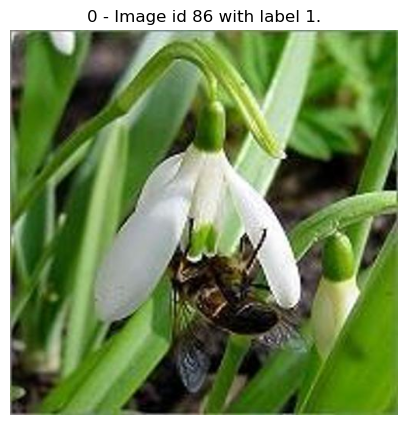

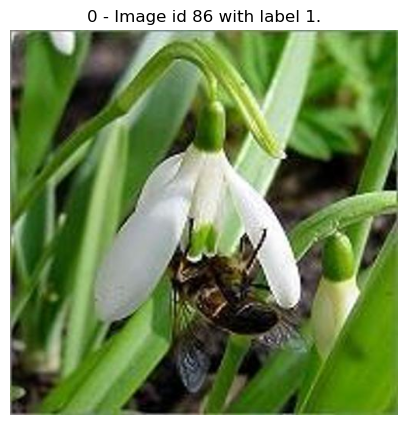

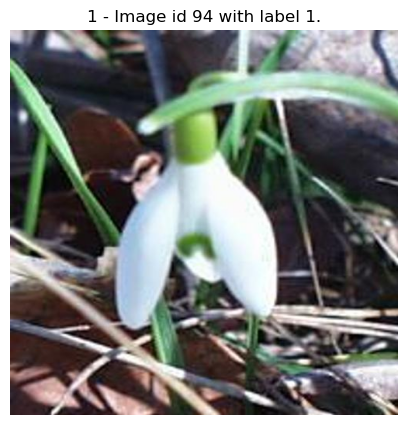

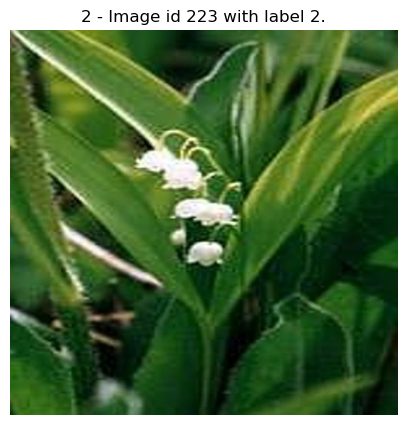

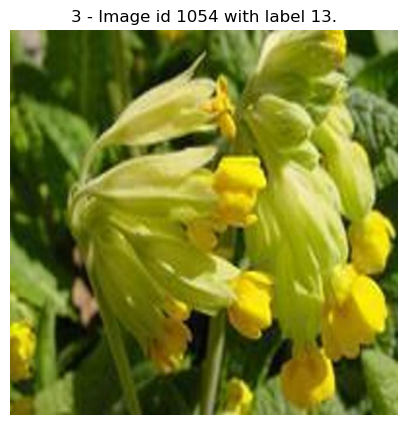

...

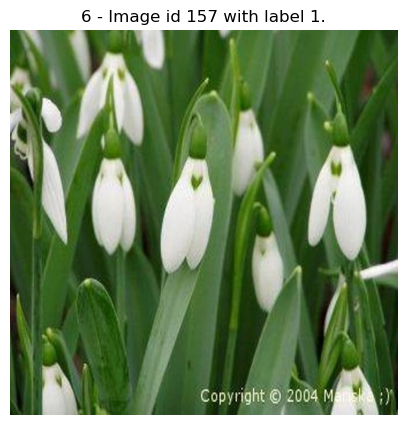

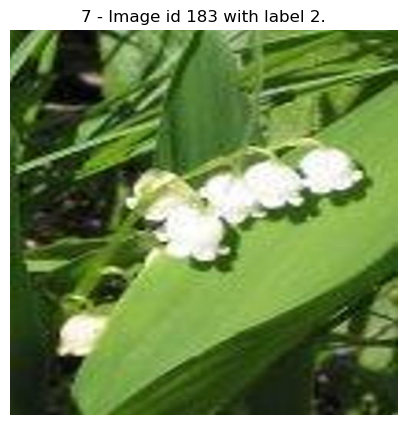

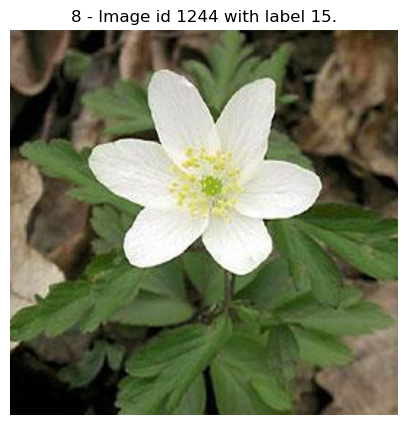

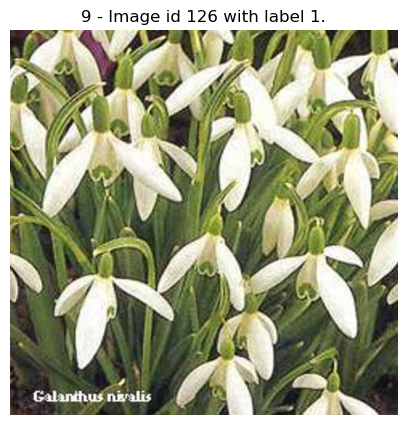

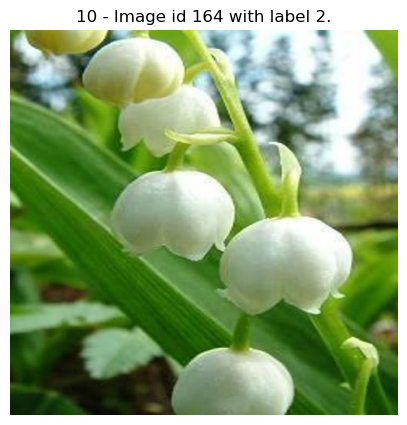

Accuracy for image id 86: 30.00%
../a3/flowers_classes-20250415T010641Z-001/flowers_classes/jpg/1/image_0086.jpg
Image: 86 with label 1
Closest image: 86 with distance 3.814697265625e-06 and label 1
Distances:  [[3.81469727e-06 7.25259476e+01 7.63212433e+01 7.68320389e+01
  7.69541931e+01 7.71603775e+01 7.88607101e+01 7.89617538e+01
  8.08112411e+01 8.08836060e+01 8.13771667e+01]]
Indices:  [ 24  23  55 263  59  53  36  45 310  34  40]
Labels:  [1, 1, 2, 13, 2, 2, 1, 2, 15, 1, 2]


In [62]:
retrieve_single_image( space, labels, dataset_path, vgg16, vgg16_transform, my_device)

### GoogLeNet

In [63]:
googlenet_imagenet_weights = models.GoogLeNet_Weights.IMAGENET1K_V1

googlenet_transform = googlenet_imagenet_weights.transforms()

googlenet = models.googlenet(weights=googlenet_imagenet_weights)

googlenet.dropout = nn.Identity() 
googlenet.fc = nn.Identity()
googlenet.eval()

GoogLeNet(
  (conv1): BasicConv2d(
    (conv): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool1): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (conv2): BasicConv2d(
    (conv): Conv2d(64, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): BasicConv2d(
    (conv): Conv2d(64, 192, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (maxpool2): MaxPool2d(kernel_size=3, stride=2, padding=0, dilation=1, ceil_mode=True)
  (inception3a): Inception(
    (branch1): BasicConv2d(
      (conv): Conv2d(192, 64, kernel_size=(1, 1), stride=(1, 1), bias=False)
      (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track

In [64]:
space, labels = represent_dataset ( dataset_path , googlenet, googlenet_transform, my_device )

Processing test set: 100%|██████████| 340/340 [00:36<00:00,  9.19it/s]

 -> [I] Space Describing Info:
 
Number of images:  340 
Number of labels:  340 
Dimension:  1024


In [65]:
run_test( space, labels, dataset_path, googlenet, googlenet_transform, my_device )

running the test phase: 100%|██████████| 340/340 [00:37<00:00,  8.97it/s]

Average accuracy in the test set: 56.82%


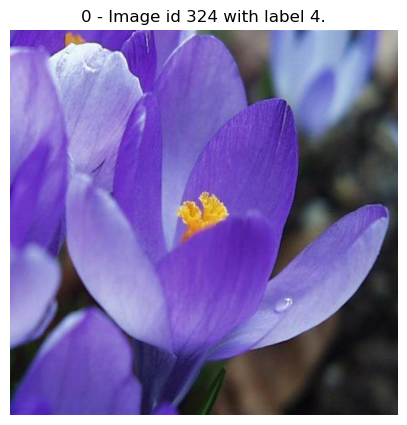

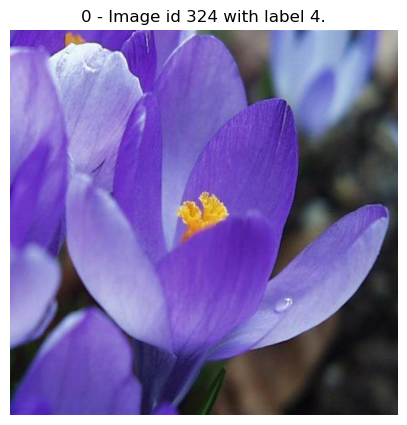

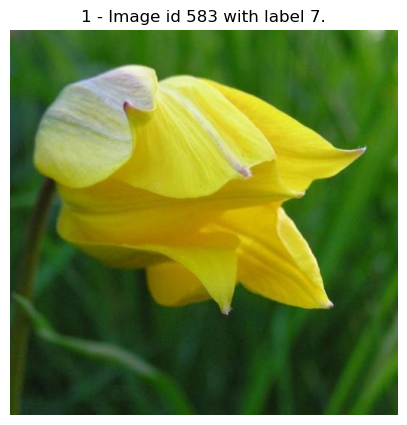

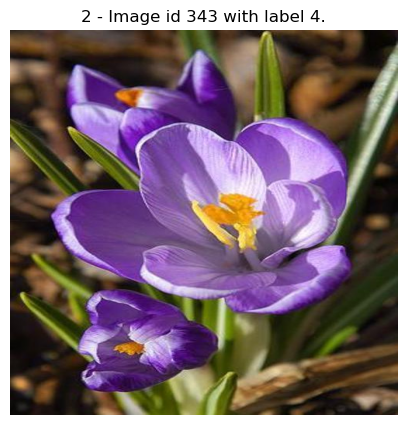

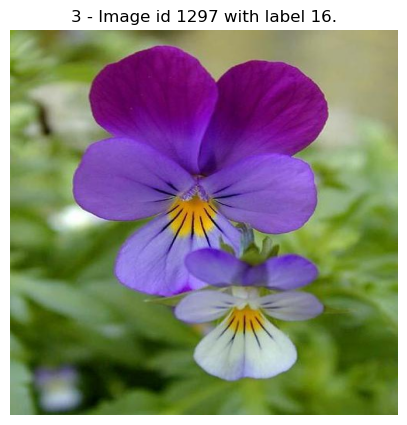

...

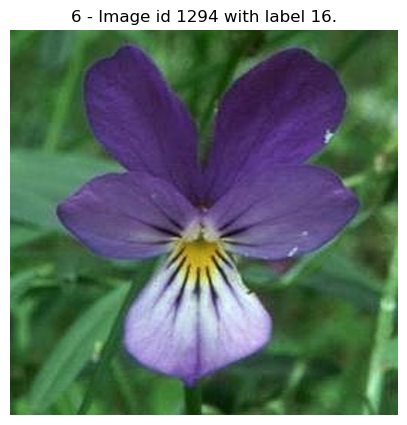

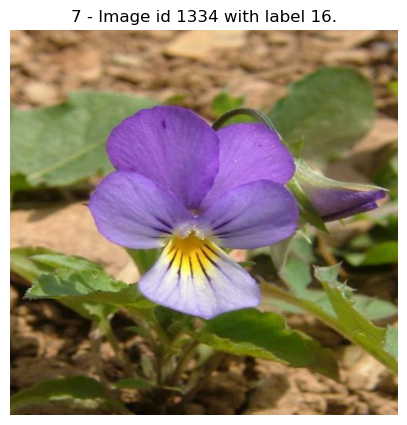

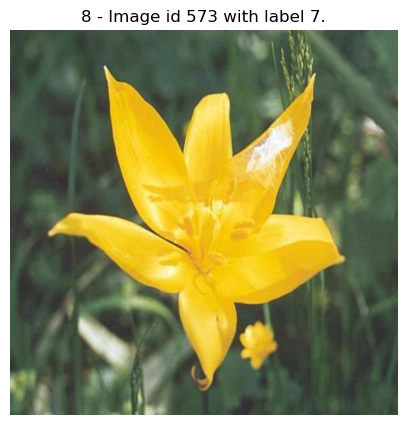

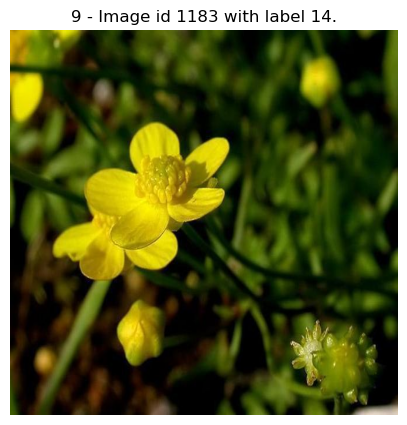

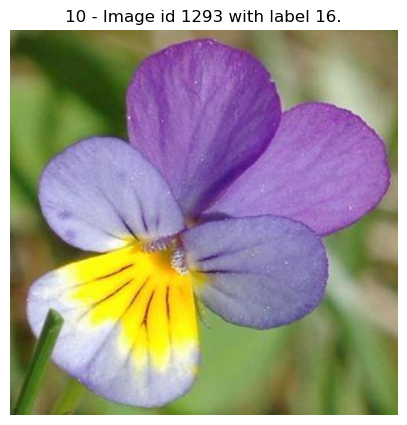

Accuracy for image id 324: 10.00%
../a3/flowers_classes-20250415T010641Z-001/flowers_classes/jpg/4/image_0324.jpg
Image: 324 with label 4
Closest image: 324 with distance 3.3717478231665154e-07 and label 4
Distances:  [[3.37174782e-07 8.49361038e+00 8.49709892e+00 8.53109455e+00
  8.67831421e+00 8.73421669e+00 8.82309341e+00 8.83901978e+00
  8.86252403e+00 8.86629391e+00 8.91231346e+00]]
Indices:  [ 80 145  85 329  14 303 323 333 148 295 328]
Labels:  [4, 7, 4, 16, 0, 15, 16, 16, 7, 14, 16]


In [66]:
retrieve_single_image( space, labels, dataset_path, googlenet, googlenet_transform, my_device)

# Results

| Arquitetura | Acurácia Média (%) |
|-------------|------------------- |
| AlexNet     | 54.50              | 
| VGG16       | 51.41              | 
| GoogLeNet   | 56.82              |

Considerando os resultados, percebe-se que o modelo mais pesado (VGG16) foi o que apresentou o pior resultado, enquanto o modelo mais leve foi o que mais se destacou (GoogLeNet). Possivelmente a questão é que o aumento da complexidade (sem propósito efetivo) não é muito coerente com a proposta de realizar a descrição profunda sobre um dataser pequeno como o Flowers-17.